In [1]:
import matplotlib as mpl
import matplotlib.pyplot as plt

In [2]:
%matplotlib inline

In [3]:
import numpy as np


In [4]:
from numpy.random import randn

In [5]:
from scipy import stats 

In [6]:
import seaborn as sns

In [7]:
import pandas as pd
from sklearn import datasets, svm, cross_validation, tree, preprocessing, metrics

C:\Users\dtele\AppData\Local\Continuum\Anaconda3\lib\site-packages\sklearn\cross_validation.py:44: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)


In [8]:
import sklearn.ensemble as ske

In [9]:
import requests
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.cross_validation import train_test_split
from sklearn.naive_bayes import MultinomialNB
import warnings

warnings.filterwarnings("ignore")

In [10]:
import logging
from optparse import OptionParser
import sys
from time import time

In [11]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import HashingVectorizer
from sklearn.feature_selection import SelectKBest, chi2
from sklearn.linear_model import RidgeClassifier
from sklearn.svm import LinearSVC
from sklearn.linear_model import SGDClassifier
from sklearn.linear_model import Perceptron
from sklearn.linear_model import PassiveAggressiveClassifier
from sklearn.naive_bayes import BernoulliNB, MultinomialNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neighbors import NearestCentroid
from sklearn.ensemble import RandomForestClassifier
from sklearn.utils.extmath import density
from sklearn import metrics
from sklearn.feature_extraction.text import TfidfTransformer

In [12]:
taws_df = pd.read_excel('just_3.xlsx', 'Sheet1', index_col=None, na_values=['NA'])

In [13]:
taws_df.head()

,CAUSE_LEVEL_1,Description,Resolution,Corrective_Action_lessons,General_Catigory,LOCATION,Merge
0,PEOPLE,"J/Eng was checking the chemical racks, where h...",1)Empty drums should not be used for storing o...,RCA - Improper storage CA - Agree with the cor...,NEAR CHEMICAL RELEASE,STORAGE SPACE,"J/Eng was checking the chemical racks, where h..."
1,ENVIRONMENT / WEATHER,One stay wire connected to Christmas Tree loos...,All stay wires should be checked for its funct...,RCA - Inadequate supervision and maintenance C...,WEATHER,OTHER,One stay wire connected to Christmas Tree loos...
2,PEOPLE,I found out that Pilot combination ladder (P) ...,NaN,RCA - Inadequate supervision and maintenance C...,EQUIPMENT CONDITION,DECK,I found out that Pilot combination ladder (P) ...
3,PEOPLE,AT (Time). One crew member kept food in microw...,while using micro wave it should not be left u...,We agree with the corrective action suggested ...,NEAR FIRE,GALLEY,AT (Time). One crew member kept food in microw...
4,PEOPLE,During loading operations in (Location) by shi...,All crew was instructed not to walk under susp...,RCA - Lack of knowledge and failure to warn CA...,NEAR CRUSHED BY,DECK,During loading operations in (Location) by shi...


In [14]:
taws_df.count()

CAUSE_LEVEL_1                30248
Description                  30248
Resolution                   23133
Corrective_Action_lessons    27446
General_Catigory             30248
LOCATION                     30248
Merge                        30248
dtype: int64

In [15]:
transformer = TfidfTransformer(smooth_idf=False)

In [16]:
transformer 

TfidfTransformer(norm='l2', smooth_idf=False, sublinear_tf=False,
         use_idf=True)

In [17]:
corpus = taws_df['Merge']

In [18]:
vectorizer = CountVectorizer(min_df=1)

In [19]:
X = vectorizer.fit_transform(corpus).toarray()

In [20]:
print (X.shape)

(30248, 30382)


In [21]:
X

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ..., 
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int64)

In [22]:
vectorizer.get_feature_names()

['00',
 '000',
 '0000',
 '0000h',
 '0000hrs',
 '0005',
 '0006',
 '0008',
 '000lb',
 '001',
 '0010',
 '00100lt',
 '0015',
 '0015lt',
 '002',
 '0020',
 '0025',
 '00250lt',
 '0029',
 '003',
 '0030',
 '0035',
 '004',
 '0042lt',
 '0045',
 '0045hrs',
 '005',
 '005s',
 '006',
 '007',
 '009',
 '009591959',
 '00am',
 '00h18',
 '00lt',
 '00m',
 '01',
 '010',
 '0100',
 '0100hrs',
 '0100lt',
 '0105',
 '0105h',
 '011',
 '0110hrs',
 '0115',
 '0118',
 '011vwd',
 '012',
 '0125lt',
 '0130',
 '0130hr',
 '013vwd',
 '014',
 '0145',
 '015',
 '0150',
 '016',
 '0169',
 '017',
 '019',
 '01and',
 '01chk',
 '01fig',
 '01no',
 '01st',
 '02',
 '0200',
 '0200hrs',
 '021',
 '0210',
 '0212',
 '0215lt',
 '022',
 '0220',
 '0221',
 '0224',
 '0228',
 '022vcp',
 '0230',
 '0230hrs',
 '0234',
 '0237',
 '023as',
 '024',
 '0240',
 '0242',
 '0248',
 '025',
 '0250',
 '0255',
 '027â',
 '02chk',
 '02fig',
 '02frm',
 '03',
 '030',
 '0300',
 '0300lt',
 '0308',
 '031',
 '0310',
 '0313',
 '0315lt',
 '0318lt',
 '032',
 '0327hrs',
 '0

In [23]:
causes = taws_df["CAUSE_LEVEL_1"].unique()
cause_dict = {value:index for index, value in enumerate(causes)}
y = taws_df["CAUSE_LEVEL_1"].map(cause_dict)
cause_dict

{'     nb      vcnb  ': 5,
 'ENVIRONMENT / WEATHER': 1,
 'EQUIPMENT': 2,
 'ORGANIZATION': 4,
 'PEOPLE': 0,
 'UNSPECIFIED': 3}

In [24]:
print ("corpuse size: %s" % len(vectorizer.get_feature_names()))

corpuse size: 30382


In [25]:
X_train, X_test, y_train, y_test = cross_validation.train_test_split(X, y, test_size = 0.2)

In [33]:
clf_dt = tree.DecisionTreeClassifier(max_depth=10)

In [34]:
clf_dt.fit (X_train, y_train)
clf_dt.score (X_test, y_test)

0.76347107438016526

In [52]:
klf = KNeighborsClassifier(n_neighbors=5)
klf.fit(X_train, y_train)
klf.score(X_test, y_test)

0.7598347107438016

In [26]:
clf = MultinomialNB()
clf.fit(X_train, y_train)
clf.score(X_test, y_test)

0.76909090909090905

In [27]:
y_test

6735     0
14090    2
8918     0
27426    0
13637    0
6850     0
8819     0
11117    0
15203    0
20594    0
4801     0
8792     0
28985    0
3819     0
13012    0
15456    2
24874    1
20471    0
26465    2
25632    1
21282    0
12323    0
21313    2
17643    0
16927    0
23576    0
15116    0
8461     0
6137     0
28756    0
        ..
24826    0
1368     0
26071    0
19234    2
636      0
28748    0
16108    0
10133    0
23686    2
29358    0
20355    0
22988    1
14123    0
17002    0
18577    0
19876    2
6380     0
11241    0
2265     2
5033     0
8667     0
6565     0
27217    0
3087     0
8549     0
16858    4
26024    0
22364    0
4915     0
11718    0
Name: CAUSE_LEVEL_1, dtype: int64

In [28]:
clf.predict(X_test)

array([0, 2, 0, ..., 0, 0, 2], dtype=int64)

In [29]:
cause_dict

{'     nb      vcnb  ': 5,
 'ENVIRONMENT / WEATHER': 1,
 'EQUIPMENT': 2,
 'ORGANIZATION': 4,
 'PEOPLE': 0,
 'UNSPECIFIED': 3}

In [39]:
text = ["A CREW MEMBER WAS OBSERVED WALKING DOWN THE STEPS IN ROUGH WEATHER WITH BOTH HIS HANDS OCCUPIED."]
vec_text = vectorizer.transform(text).toarray()

In [40]:
clf.predict(vec_text)

array([0], dtype=int64)

In [34]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1, )

In [35]:
pd.DataFrame(vec_text, columns=vectorizer.get_feature_names())

,00,000,0000,0000h,0000hrs,0005,0006,0008,000lb,001,...,œsvejserojneâ,œtaking,œthe,œthink,œtool,œweak,œwere,œwhatever,œworking,œworst
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [34]:
shuffle_validator = cross_validation.ShuffleSplit(len(X), n_iter=20, test_size=0.2)
def test_classifier(clf):
    scores = cross_validation.cross_val_score(clf, X, y, cv=shuffle_validator)
    print("Accuracy: %0.4f (+/- %0.2f)" % (scores.mean(), scores.std()))

In [ ]:
test_classifier(clf)

Accuracy: 0.7720 (+/- 0.00)


In [54]:
import missingno as msno

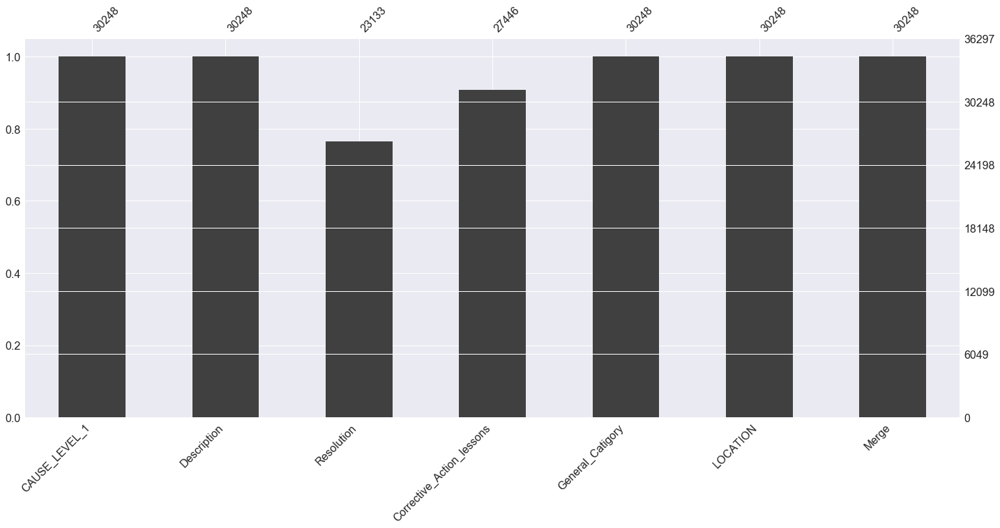

In [55]:
msno.bar(taws_df)

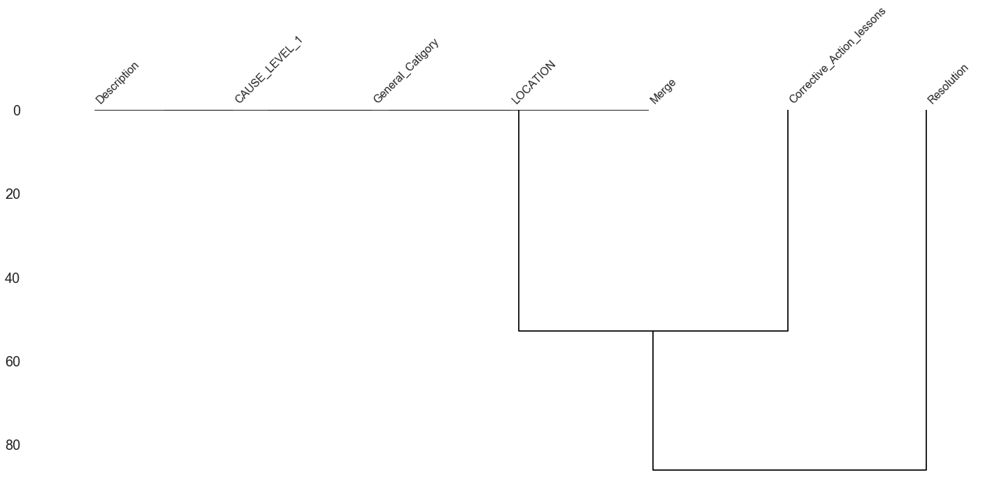

In [56]:
msno.dendrogram(taws_df)

In [35]:
taws_df.ix[163]

CAUSE_LEVEL_1                                                           PEOPLE
Description                  While rigging anti piracy equipments it was no...
Resolution                   Crew member was warned about the unsafe practi...
Corrective_Action_lessons                                                  NaN
General_Catigory                                                      NEAR CUT
LOCATION                                                                  DECK
Merge                        While rigging anti piracy equipments it was no...
Name: 163, dtype: object

In [43]:
zaws_df = pd.read_excel('500sheet.xlsx', 'Sheet1', index_col=None)

In [44]:
zaws_df.head()

,records
0,"J/Eng was checking the chemical racks, where h..."
1,I found out that Pilot combination ladder (P) ...
2,AT (Time). One crew member kept food in microw...
3,During loading operations in (Location) by shi...
4,BEFORE WHEN WE WERE ENTERING INTO CARGO HOLD N...


In [45]:
t = zaws_df.ix[range(499)]

In [46]:
print(t)

                                               records
0    J/Eng was checking the chemical racks, where h...
1    I found out that Pilot combination ladder (P) ...
2    AT (Time). One crew member kept food in microw...
3    During loading operations in (Location) by shi...
4    BEFORE WHEN WE WERE ENTERING INTO CARGO HOLD N...
5    Loading Master Found Using Cell Phone On deck,...
6    Deck Crew not wearing Safety Helmet while work...
7    During bunkering operation found 4/E not wear ...
8    One of the crew members lost his eye goggles i...
9    GENERATOR SPARE CYLINDER HEAD WAS FOUND UNSECU...
10   The Fitter was noticed by the master coming on...
11   It was found that there was a fire in the dust...
12   As i enter the crew mess to get some water to ...
13   A CREW MEMBER WAS OBSERVED WALKING DOWN THE ST...
14   DURING ROUTINE CHECKING AROUND DECK FOUND AB  ...
15   The tug broke the ships rope while pulling it....
16   Ch Off found moving on deck without Safety hel...
17   Greas

In [47]:
t

,records
0,"J/Eng was checking the chemical racks, where h..."
1,I found out that Pilot combination ladder (P) ...
2,AT (Time). One crew member kept food in microw...
3,During loading operations in (Location) by shi...
4,BEFORE WHEN WE WERE ENTERING INTO CARGO HOLD N...
5,"Loading Master Found Using Cell Phone On deck,..."
6,Deck Crew not wearing Safety Helmet while work...
7,During bunkering operation found 4/E not wear ...
8,One of the crew members lost his eye goggles i...
9,GENERATOR SPARE CYLINDER HEAD WAS FOUND UNSECU...


In [48]:
c = zaws_df.ix[123]
vect_c = vectorizer.transform(c).toarray()

In [49]:
clf.predict(vect_c)

array([2], dtype=int64)

In [50]:
j = 0


In [51]:
u = 0

In [52]:
for j in range(499):
    z = zaws_df.ix[j]
    vect_z = vectorizer.transform(z).toarray()
    p = clf.predict(vect_z)
    print(p)         

[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[2]
[0]
[0]
[2]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[2]
[2]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[2]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[2]
[2]
[2]
[2]
[0]
[2]
[2]
[2]
[2]
[2]
[2]
[0]
[2]
[2]
[0]
[2]
[2]
[2]
[2]
[0]
[0]
[0]
[2]
[0]
[2]
[2]
[2]
[0]
[2]
[0]
[2]
[0]
[2]
[2]
[0]
[0]
[2]
[2]
[2]
[2]
[0]
[2]
[2]
[2]
[0]
[0]
[2]
[0]
[2]
[0]
[0]
[2]
[2]
[2]
[2]
[2]
[2]
[2]
[0]
[0]
[0]
[2]
[0]
[0]
[2]
[2]
[2]
[2]
[0]
[2]
[2]
[0]
[2]
[2]
[2]
[0]
[0]
[0]
[0]
[2]
[2]
[2]
[2]
[0]
[2]
[2]
[0]
[2]
[2]
[2]
[2]
[0]
[2]
[2]
[2]
[2]
[0]
[2]
[2]
[0]
[1]
[0]
[1]
[0]
[0]
[1]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[1]
[2]
[2]
[2]
[1]
[0]
[0]
[2]
[2]
[1]
[2]
[0]
[1]
[2]
[0]
[2]
[0]
[0]
[0]
[0]
[0]
[1]
[2]
[2]
[1]
[0]
[0]
[0]
[2]
[0]
[2]
[2]
[2]
[2]


In [53]:
zaws_df.describe()

,records
count,499
unique,477
top,During the fire drill engine fitter slipped an...
freq,4


In [54]:
from numpy.random import randn

In [55]:
from matplotlib.axes import Subplot as plt

In [56]:
from scipy.signal import freqz



In [57]:
import matplotlib
from matplotlib.backends.backend_qt4agg import FigureCanvasQTAgg as FigureCanvas
from matplotlib.figure import Figure
from matplotlib.axes import Subplot


In [58]:
taws_df.describe()

,CAUSE_LEVEL_1,Description,Resolution,Corrective_Action_lessons,General_Catigory,LOCATION,Merge
count,30248,30248,23133,27446,30248,30248,30248
unique,6,29516,21237,23691,568,27,29861
top,PEOPLE,Grinding machine left in running condition wit...,Training,1. Noted.,PPE NOT USED,DECK,Hole was found in air hose during Generator jo...
freq,23193,5,297,89,2342,11604,4


In [59]:
taws_df['CAUSE_LEVEL_1'].describe()

count      30248
unique         6
top       PEOPLE
freq       23193
Name: CAUSE_LEVEL_1, dtype: object

In [60]:
zaws_df['records'].describe()

count                                                   499
unique                                                  477
top       During the fire drill engine fitter slipped an...
freq                                                      4
Name: records, dtype: object

In [61]:
tf_clf_dnn = skflow.TensorFlowDNNClassifiere(hiddden_units=[20,40,20],
                                             n_classes=2, batch_size=256,
                                             steps=1000, learning_rate=0.05)

NameError: name 'skflow' is not defined

In [62]:
from tensorflow.contrib.skflow.python import skflow

ModuleNotFoundError: No module named 'tensorflow'

In [63]:
import tensorflow.contrib.skflow

ModuleNotFoundError: No module named 'tensorflow'

In [64]:
import tensorflow as tf


ModuleNotFoundError: No module named 'tensorflow'

In [65]:
taws_df['CAUSE_LEVEL_1'].unique()

array(['PEOPLE', 'ENVIRONMENT / WEATHER', 'EQUIPMENT', 'UNSPECIFIED',
       'ORGANIZATION', '     nb      vcnb  '], dtype=object)

In [66]:
causes

array(['PEOPLE', 'ENVIRONMENT / WEATHER', 'EQUIPMENT', 'UNSPECIFIED',
       'ORGANIZATION', '     nb      vcnb  '], dtype=object)

In [67]:
y = taws_df["CAUSE_LEVEL_1"].map(cause_dict)

In [68]:
y

0        0
1        1
2        0
3        0
4        0
5        0
6        0
7        0
8        0
9        0
10       0
11       0
12       0
13       0
14       0
15       0
16       0
17       2
18       3
19       0
20       0
21       0
22       0
23       0
24       0
25       0
26       0
27       0
28       0
29       0
        ..
30218    0
30219    0
30220    2
30221    2
30222    0
30223    2
30224    4
30225    0
30226    0
30227    0
30228    2
30229    0
30230    2
30231    0
30232    0
30233    0
30234    0
30235    0
30236    0
30237    0
30238    0
30239    0
30240    0
30241    0
30242    0
30243    0
30244    2
30245    0
30246    0
30247    2
Name: CAUSE_LEVEL_1, dtype: int64

In [69]:
import csv

In [70]:
X

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ..., 
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int64)

In [71]:
jaws_df = pd.read_excel('jmarge.xlsx', 'Sheet1', index_col=None)

In [72]:
jaws_df.head()

,Description
0,"J/Eng was checking the chemical racks, where h..."
1,One stay wire connected to Christmas Tree loos...
2,I found out that Pilot combination ladder (P) ...
3,AT (Time). One crew member kept food in microw...
4,During loading operations in (Location) by shi...


In [73]:
s = 0 

In [74]:
for s in range(30248):
    v = jaws_df.ix[s]
    vect_v = vectorizer.transform(v).toarray()
    w = clf.predict(vect_v)
    print(w)
   

[0]
[1]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[2]
[2]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[2]
[0]
[0]
[2]
[2]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[2]
[0]
[2]
[0]
[0]
[2]
[0]
[1]
[0]
[0]
[0]
[0]
[0]
[2]
[0]
[0]
[0]
[0]
[2]
[0]
[0]
[0]
[2]
[2]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[2]
[2]
[0]
[0]
[0]
[2]
[4]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[2]
[2]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[2]
[0]
[0]
[0]
[1]
[0]
[0]
[0]
[0]
[2]
[0]
[0]
[2]
[0]
[2]
[2]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[2]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[2]
[0]
[0]
[0]
[0]
[0]
[0]
[2]
[0]
[2]
[4]
[0]
[0]
[2]
[2]
[2]
[0]
[0]
[0]
[0]
[0]
[0]
[2]
[2]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[2]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[2]
[2]
[0]
[0]
[0]
[0]
[2]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[4]
[0]
[0]
[0]
[0]
[0]
[2]
[2]
[0]
[0]


In [75]:
w

array([2], dtype=int64)

In [76]:
o = jaws_df

In [77]:
for s in range(5054):
    n = jaws_df.ix[s]
    vect_n = vectorizer.transform(n).toarray()
    e = clf.predict(vect_n)
    probas = e.predict_proba(vect_n)
    print(e)

AttributeError: 'numpy.ndarray' object has no attribute 'predict_proba'

In [78]:
for s in range(5054):
    n = jaws_df.ix[s]
    vect_n = vectorizer.transform(n).toarray()
    e = clf.predict(vect_n)
    q = clf.score(vect_n)
    print(e)

TypeError: score() missing 1 required positional argument: 'y'

In [79]:
taws_df.to_excel('ofcause.xlsx', sheet_name='Sheet1')

In [80]:
k = taws_df['CAUSE_LEVEL_1']

In [81]:
jaws_df.to_excel('ofcause.xlsx', sheet_name='Sheet1')

In [82]:
import xlrd

In [83]:
g = y.to_frame

In [84]:
with open("C:\\Users\\dtele\\agent.log", 'a') as f:
    print(y, file=f)

In [85]:
taws_df[19:25]

,CAUSE_LEVEL_1,Description,Resolution,Corrective_Action_lessons,General_Catigory,LOCATION,Merge
19,PEOPLE,Ch Off found moving on deck without Safety hel...,Ch Off was instructed to use required PPE at a...,Near miss viewed seriously as Ch. Off. is a se...,PPE NOT USED,DECK,Ch Off found moving on deck without Safety hel...
20,PEOPLE,Grease was found on the stbd side gangway step...,1.Access areas should always be kept free from...,RCA - Poor housekeeping as grease on gangway s...,NEAR SLIP/TRIP,GANGWAY,Grease was found on the stbd side gangway step...
21,PEOPLE,During routine housekeeping and safety inspect...,"Fire doors to be kept closed at all times, and...",RCA-Inadequate securing and inadequate supervi...,FIRE PROTECTION - DOOR,ENGINE ROOM,During routine housekeeping and safety inspect...
22,PEOPLE,MTM & Wiper found not wearing safety helmet wh...,Both engine ratings were instructed to use req...,Safety helmet should be used when working in e...,PPE NOT USED,INTERIOR SPACE,MTM & Wiper found not wearing safety helmet wh...
23,PEOPLE,During routine inspection it was noted loose i...,Vessel to be secured for sea at all times. In ...,RCA - Inadequate securing All loose equipment ...,NEAR FALLING OBJECT,OTHER,During routine inspection it was noted loose i...
24,PEOPLE,A CREW MEMBER WAS OBSERVED WALKING DOWN THE ST...,NOTIFIED ABOUT THE TRIPPING HAZARD AND CREW WA...,"RCA ? Inadequate behavior, Lack of knowledge C...",FALL OR NEAR FALL,OTHER,A CREW MEMBER WAS OBSERVED WALKING DOWN THE ST...


In [86]:
p = taws_df[19:24]

In [87]:
p

,CAUSE_LEVEL_1,Description,Resolution,Corrective_Action_lessons,General_Catigory,LOCATION,Merge
19,PEOPLE,Ch Off found moving on deck without Safety hel...,Ch Off was instructed to use required PPE at a...,Near miss viewed seriously as Ch. Off. is a se...,PPE NOT USED,DECK,Ch Off found moving on deck without Safety hel...
20,PEOPLE,Grease was found on the stbd side gangway step...,1.Access areas should always be kept free from...,RCA - Poor housekeeping as grease on gangway s...,NEAR SLIP/TRIP,GANGWAY,Grease was found on the stbd side gangway step...
21,PEOPLE,During routine housekeeping and safety inspect...,"Fire doors to be kept closed at all times, and...",RCA-Inadequate securing and inadequate supervi...,FIRE PROTECTION - DOOR,ENGINE ROOM,During routine housekeeping and safety inspect...
22,PEOPLE,MTM & Wiper found not wearing safety helmet wh...,Both engine ratings were instructed to use req...,Safety helmet should be used when working in e...,PPE NOT USED,INTERIOR SPACE,MTM & Wiper found not wearing safety helmet wh...
23,PEOPLE,During routine inspection it was noted loose i...,Vessel to be secured for sea at all times. In ...,RCA - Inadequate securing All loose equipment ...,NEAR FALLING OBJECT,OTHER,During routine inspection it was noted loose i...


In [88]:
vect_s = vectorizer.transform(p).toarray()

In [89]:
clf.predict(vect_s)

array([0, 0, 0, 0, 0, 0, 0], dtype=int64)

In [90]:
vect_s

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ..., 
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int64)

In [91]:
text_file = open("write_it.text","w") 

In [97]:
text_file.write(g)

TypeError: write() argument must be str, not method

In [93]:
text_file = open("mytest.text","w") 
for i in range(1,10):
    text_file.write(str(jaws_df.ix[i]))
text_file.close()

In [94]:
text_file = open("mytest.text","w") 
for i in range(len(y)):
    text_file.write(str(y))
text_file.close()

In [95]:
print(len(y))


30248


In [96]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [98]:
y

0        0
1        1
2        0
3        0
4        0
5        0
6        0
7        0
8        0
9        0
10       0
11       0
12       0
13       0
14       0
15       0
16       0
17       2
18       3
19       0
20       0
21       0
22       0
23       0
24       0
25       0
26       0
27       0
28       0
29       0
30       2
31       0
32       0
33       0
34       0
35       0
36       0
37       0
38       0
39       0
40       0
41       0
42       2
43       1
44       0
45       2
46       0
47       1
48       2
49       0
50       0
51       0
52       0
53       0
54       0
55       0
56       0
57       1
58       2
59       0
60       1
61       0
62       2
63       2
64       0
65       0
66       0
67       0
68       0
69       0
70       0
71       0
72       0
73       0
74       0
75       0
76       0
77       0
78       0
79       0
80       0
81       0
82       0
83       0
84       0
85       2
86       2
87       0
88       0
89       0
90       2

In [99]:
myprob = clf.predict_proba(X)

In [100]:
np.set_printoptions(precision= 5, threshold=np.inf)

In [101]:
myprob

array([[  1.00000e+000,   9.31844e-022,   1.18465e-012,   6.43580e-097,
          1.32567e-019,   1.01224e-180],
       [  4.28282e-007,   3.99719e-003,   9.96002e-001,   6.14542e-059,
          4.26513e-015,   6.07384e-108],
       [  9.69500e-001,   1.47176e-009,   3.04996e-002,   2.70498e-046,
          1.93700e-010,   2.13742e-080],
       [  1.00000e+000,   6.26776e-017,   8.06437e-008,   1.11470e-066,
          4.89570e-014,   7.14877e-119],
       [  1.00000e+000,   5.45448e-027,   2.97810e-017,   1.33406e-107,
          1.63094e-023,   2.65813e-198],
       [  9.98284e-001,   4.19933e-012,   1.71616e-003,   1.90977e-061,
          1.68505e-011,   6.24094e-111],
       [  1.00000e+000,   2.91828e-018,   1.26478e-016,   2.00520e-049,
          5.51318e-014,   2.45766e-087],
       [  1.00000e+000,   9.47176e-047,   1.80773e-035,   4.94283e-119,
          4.93438e-039,   4.40616e-209],
       [  1.00000e+000,   1.09478e-042,   1.57306e-032,   5.80619e-107,
          3.72483e-036, 

In [102]:
clf.predict_log_proba(X)

array([[ -1.13687e-12,  -4.84249e+01,  -2.74616e+01,  -2.21489e+02,
         -4.34672e+01,  -4.14453e+02],
       [ -1.46635e+01,  -5.52216e+00,  -4.00563e-03,  -1.34037e+02,
         -3.30883e+01,  -2.46875e+02],
       [ -3.09744e-02,  -2.03368e+01,  -3.49004e+00,  -1.04924e+02,
         -2.23647e+01,  -1.83447e+02],
       [ -8.06438e-08,  -3.73085e+01,  -1.63332e+01,  -1.51862e+02,
         -3.06478e+01,  -2.72041e+02],
       [  0.00000e+00,  -6.04734e+01,  -3.80527e+01,  -2.46088e+02,
         -5.24703e+01,  -4.54934e+02],
       [ -1.71763e-03,  -2.61961e+01,  -6.36767e+00,  -1.39811e+02,
         -2.48066e+01,  -2.53756e+02],
       [ -5.68434e-14,  -4.03755e+01,  -3.66065e+01,  -1.12131e+02,
         -3.05290e+01,  -1.99426e+02],
       [  0.00000e+00,  -1.05973e+02,  -7.99984e+01,  -2.72410e+02,
         -8.82046e+01,  -4.79757e+02],
       [  0.00000e+00,  -9.66180e+01,  -7.32297e+01,  -2.44618e+02,
         -8.15780e+01,  -4.20973e+02],
       [  0.00000e+00,  -8.91994e+01,

In [103]:
clf.predict(X_test)

array([0, 2, 0, 0, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 2, 0,
       0, 0, 0, 0, 0, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 0, 0,
       0, 0, 2, 2, 4, 0, 0, 0, 0, 2, 2, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 2,
       0, 2, 0, 2, 0, 2, 2, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 2,
       0, 0, 0, 2, 4, 2, 0, 0, 2, 0, 2, 0, 0, 2, 4, 0, 2, 4, 0, 0, 0, 0, 2,
       0, 2, 0, 0, 0, 2, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0,
       0, 0, 0, 2, 0, 0, 0, 1, 0, 2, 0, 4, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 2,
       0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2,
       0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 2, 2, 0, 0, 2, 0, 0, 2, 2, 2,
       2, 2, 0, 0, 2, 0, 2, 0, 4, 0, 0, 2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 2, 2, 0, 0, 0, 2, 2, 2,
       2, 2, 2, 2, 0, 0, 2, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0,
       2, 2,

In [104]:
clf.coef_

array([[-10.70394, -13.07107, -14.16968, -14.16968, -13.07107, -14.16968,
        -13.47653, -13.47653, -14.16968, -13.47653, -12.78339, -14.16968,
        -13.47653, -13.47653, -13.07107, -13.47653, -14.16968, -14.16968,
        -13.47653, -14.16968, -13.47653, -13.47653, -13.07107, -14.16968,
        -13.47653, -13.47653, -12.78339, -13.47653, -14.16968, -13.47653,
        -13.07107, -14.16968, -13.47653, -14.16968, -13.47653, -14.16968,
        -10.87384, -14.16968, -12.78339, -14.16968, -14.16968, -13.47653,
        -14.16968, -13.47653, -13.47653, -13.47653, -14.16968, -13.47653,
        -14.16968, -14.16968, -14.16968, -14.16968, -13.47653, -13.47653,
        -14.16968, -14.16968, -13.47653, -14.16968, -14.16968, -14.16968,
        -14.16968, -14.16968, -13.47653, -13.47653, -13.47653, -13.07107,
        -10.80238, -12.78339, -14.16968, -13.47653, -14.16968, -13.47653,
        -14.16968, -14.16968, -14.16968, -14.16968, -14.16968, -14.16968,
        -13.47653, -13.07107, -14.1696

In [105]:
def train_test(n):
    t = X * n
    k = y * n
    model.fit(t, k)
    print

In [106]:
my_data = [taws_df['Description'], y, taws_df['CAUSE_LEVEL_1'], y_test]
result = pd.concat(my_data,axis=1)
print(result[0:3])

                                         Description  CAUSE_LEVEL_1  \
0  J/Eng was checking the chemical racks, where h...              0   
1  One stay wire connected to Christmas Tree loos...              1   
2  I found out that Pilot combination ladder (P) ...              0   

           CAUSE_LEVEL_1  CAUSE_LEVEL_1  
0                 PEOPLE            NaN  
1  ENVIRONMENT / WEATHER            NaN  
2                 PEOPLE            NaN  


In [107]:
print(result)

                                             Description  CAUSE_LEVEL_1  \
0      J/Eng was checking the chemical racks, where h...              0   
1      One stay wire connected to Christmas Tree loos...              1   
2      I found out that Pilot combination ladder (P) ...              0   
3      AT (Time). One crew member kept food in microw...              0   
4      During loading operations in (Location) by shi...              0   
5      BEFORE WHEN WE WERE ENTERING INTO CARGO HOLD N...              0   
6      Loading Master Found Using Cell Phone On deck,...              0   
7      Deck Crew not wearing Safety Helmet while work...              0   
8      During bunkering operation found 4/E not wear ...              0   
9      One of the crew members lost his eye goggles i...              0   
10     GENERATOR SPARE CYLINDER HEAD WAS FOUND UNSECU...              0   
11     The Fitter was noticed by the master coming on...              0   
12     It was found that 

In [108]:
result.to_excel('my_datare.xlsx')

In [109]:
print(clf.predict(X[2:3]))

[0]


In [110]:
pwas_df = pd.read_excel('200ex.xlsx', 'Sheet1', index_col=None)

In [111]:
pwas_df.head()

,Description
0,"J/Eng was checking the chemical racks, where h..."
1,One stay wire connected to Christmas Tree loos...
2,I found out that Pilot combination ladder (P) ...
3,AT (Time). One crew member kept food in microw...
4,During loading operations in (Location) by shi...


In [112]:
n = 0

In [113]:
for n in range(200):
    pm = pwas_df.ix[n]
    vect_pm = vectorizer.transform(pm).toarray()
    m = clf.predict(vect_pm)
    print(m)         

[0]
[1]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[2]
[2]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[2]
[0]
[0]
[2]
[2]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[2]
[0]
[2]
[0]
[0]
[2]
[0]
[1]
[0]
[0]
[0]
[0]
[0]
[2]
[0]
[0]
[0]
[0]
[2]
[0]
[0]
[0]
[2]
[2]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[2]
[2]
[0]
[0]
[0]
[2]
[4]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[2]
[2]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[2]
[0]
[0]
[0]
[1]
[0]
[0]
[0]
[0]
[2]
[0]
[0]
[2]
[0]
[2]
[2]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[2]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[2]
[0]
[0]
[0]
[0]
[0]
[0]
[2]
[0]
[2]
[4]
[0]
[0]
[2]
[2]
[2]
[0]
[0]
[0]
[0]
[0]
[0]
[2]
[2]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]


In [114]:
pwas_df.describe()

,Description
count,200
unique,184
top,01. Portable Pump not ready on bunkering site ...
freq,4


In [115]:
sample_dataframe = taws_df.sample(n=200)

In [116]:
sample_dataframe


,CAUSE_LEVEL_1,Description,Resolution,Corrective_Action_lessons,General_Catigory,LOCATION,Merge
17916,EQUIPMENT,While underway offshore the steering autopilot...,The engineer was able to repair the number one...,Always keep a proper watch in pilothouse. Neve...,Near Steering Loss/Propulsion,INTERIOR SPACE,While underway offshore the steering autopilot...
28075,PEOPLE,During general inspection some gratings on cat...,The locking mechanism had become loose by itse...,To change the construction of the locking devi...,near fall,DECK,During general inspection some gratings on cat...
24461,PEOPLE,Kitchen knife was not in it place in galley at...,All crew members and Chief Cook have been re-i...,"The kitchen knife was taken out poster""Put on ...",STOWING OBJECTS,GALLEY,Kitchen knife was not in it place in galley at...
28377,ORGANIZATION,Whilst overhauling a pump in the engine room w...,No bearing heater onboard the vessel. Bearing ...,A bearing heater had been prevously ordered wi...,Spill/leak Oil,ENGINE ROOM,Whilst overhauling a pump in the engine room w...
9807,PEOPLE,"During maintenance of D/G Fuel Oil Pump, one c...",NaN,"During meeting, all crew reminded to think saf...",near crushed by,ENGINE ROOM,"During maintenance of D/G Fuel Oil Pump, one c..."
16774,ORGANIZATION,"While assisting ""{ship}"" to anchor from LB 308...",Mate called Pilot and let him know emphaticall...,Anchors should not be worked on the same side...,near flying line,DECK,"While assisting ""{ship}"" to anchor from LB 308..."
26198,EQUIPMENT,While transfering {Noun} Thinner from B-deck t...,"Having received {Noun} Thinner in {Location}, ...",The {Noun} Paint drums are of a weaker design ...,Near falling object,DECK,While transfering {Noun} Thinner from B-deck t...
15215,PEOPLE,"During unberthing, while letting go of aft tug...",STO Work issued. Crew was advice to stand well...,Discussed in toolbox meeting and safety moment...,near flying line,DECK,"During unberthing, while letting go of aft tug..."
16408,ENVIRONMENT / WEATHER,While conducting mooring operations the vessel...,Master took immediate action and reassessed th...,It is important to assess the weather conditio...,near collision,DECK,While conducting mooring operations the vessel...
18481,EQUIPMENT,The Chief Engineer was doing rounds and saw th...,The skiff was brought aboard and immediately d...,Bring the skiff aboard when the weather is mar...,Near Pollution/Spill,DECK,The Chief Engineer was doing rounds and saw th...


In [117]:
sample_dataframe.to_excel('sample200.xlsx')

In [118]:
spwas_df = pd.read_excel('ss200.xlsx', 'Sheet1', index_col=None)

In [119]:
spwas_df

,Merge
0,During accomodation inspection it was noticed ...
1,SPANNER SLIPPED HITTING ON FACE DURING OVERHAU...
2,The vessel was anchored at {Location} anchorag...
3,"DURING WEEKLY INSPECTION OF GALLEY AND PANTRY,..."
4,OS NOT WEARING GOGGLES WHILE CHIPPING AND 3/0 ...
5,Two different courses were plotted on the same...
6,Watertight Doors on upper deck left open durin...
7,Cone stacker slipped from a container corner c...
8,Parka getting caught on the control lever of m...
9,One of Engine Staff during paintig ER platform...


In [120]:
spwas_df.describe()

,Merge
count,200
unique,200
top,"DURING LIFEBOAT LAUNCHING, THE L/B DAVIT HYDRA..."
freq,1


In [121]:
g = 0

In [122]:
for g in range(200):
    sm = spwas_df.ix[g]
    vect_sm = vectorizer.transform(sm).toarray()
    h = clf.predict(vect_sm)
    print(h)         

[0]
[0]
[1]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[2]
[0]
[0]
[0]
[0]
[2]
[0]
[2]
[0]
[2]
[0]
[0]
[0]
[4]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[2]
[0]
[0]
[2]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[2]
[0]
[0]
[0]
[0]
[0]
[0]
[2]
[2]
[2]
[0]
[0]
[2]
[2]
[2]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[2]
[0]
[0]
[2]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[2]
[0]
[0]
[2]
[0]
[2]
[2]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[2]
[4]
[2]
[2]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[4]
[2]
[0]
[0]
[0]
[0]
[2]
[4]
[0]
[0]
[0]
[0]
[0]
[0]
[2]
[0]
[0]
[2]
[0]
[0]
[0]
[0]
[2]
[0]
[0]
[0]
[0]
[2]
[2]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[1]
[0]
[0]
[0]
[0]
[0]
[0]
[2]
[0]
[0]
[0]
[2]
[2]
[0]
[0]
[2]
[0]
[0]
[0]
[0]
[0]
[2]
[2]
[0]
[4]
[2]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[2]
[4]
[2]
[0]
[2]
[0]
[2]
[2]
[0]
[0]
[2]
[4]
